In [1]:
import pandas as pd
import numpy as np
import pickle as pk
import matplotlib.pyplot as plt
from matplotlib import cm
from collections import defaultdict, Counter

import scipy.stats as st

from numpy import polyfit 

from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN

import plotly.graph_objects as go
import plotly.express as px
from plotly.io import write_image, write_html

from ElMD import ElMD
from ElM2D import ElM2D

from fitter import Fitter

pd.options.display.max_rows = 10

# Read in initial database and add normalised stoichiometric composition and numeric columns for structure and classification target

In [10]:
# Read in initial data and filter any extrapolated values if these have been processed
# Please download data from https://pcwww.liv.ac.uk/~msd30/lmds/LiIonDatabase.html
df = pd.read_csv("PATH TO DOWNLOADED DATASET")
df = df[df["ID"] < 2000]

# Feature encode the structure type, composition, and classification target for each material
le = LabelEncoder()
df["structure"] = le.fit_transform(df["family"])
df["pretty_formula"] = [ElMD(f).pretty_formula for f in df["composition"]]
df["classification_target"] = [int(x >= -4) for x in df['log_target']]

# Filter out the room temperature reports
rt_df = df[(df["temperature"] >= 15) & (df["temperature"] <= 35)]
rt_df

,ID,composition,source,temperature,target,log_target,family,ChemicalFamily,structure,pretty_formula,classification_target
1,2,Li2OHBr,10.1002/aenm.201700971,22.06,5.400000e-07,-6.267606,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Br0.2 H0.2,0
2,3,Li2.4OH0.6Cl,10.1002/aenm.201700971,26.00,8.900000e-08,-7.050610,Anti-Perovskite,Oxides and Other Anions,0,Li0.48 O0.2 Cl0.2 H0.12,0
3,4,Li2.1OH0.9Cl,10.1002/aenm.201700971,26.00,8.050000e-08,-7.094204,Anti-Perovskite,Oxides and Other Anions,0,Li0.42 O0.2 Cl0.2 H0.18,0
4,5,Li2OHCl,10.1002/aenm.201700971,26.00,7.110000e-08,-7.148130,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Cl0.2 H0.2,0
5,6,Li2.7OH0.3Cl,10.1002/aenm.201700971,26.00,7.300000e-09,-8.136677,Anti-Perovskite,Oxides and Other Anions,0,Li0.54 O0.2 Cl0.2 H0.06,0
...,...,...,...,...,...,...,...,...,...,...,...
772,915,Li6SiO4Cl2,10.1021/acs.chemmater.1c00157,25.00,1.000000e-10,-10.000000,Argyrodite,Oxides and Other Anions,1,Li0.462 Si0.077 O0.308 Cl0.154,0
774,917,LiTa2PO8,10.1039/C8TA09170F,25.00,1.600000e-03,-2.795880,Other,Oxides,9,Li0.083 Ta0.167 P0.083 O0.667,1
785,927,Li0.022 La0.118 Ti0.2 Al0.004 O0.631,10.1007/BF02378009,30.00,8.910000e-04,-3.049976,Perovskite,Oxides,10,Li0.023 La0.121 Ti0.205 Al0.004 O0.647,1
787,930,Li2ZrS3,10.1016/j.ssi.2008.01.055,30.00,7.300000e-06,-5.136677,Thio-LISICON,Sulphides,13,Li0.333 Zr0.167 S0.5,0


# Extrapolate any rt conductivities for entries which have multiple higher temperature readings

In [11]:
extrap_d = defaultdict(list)

# Add all compositions and associated readings if these are not in rt dataset
for i, f in enumerate(df["pretty_formula"]):
    if f in rt_df["pretty_formula"].to_list():
        continue
    else:
        # print(f)
        extrap_d[f].append((df.iloc[i]))

# Take all compositions with multiple high temperature readings and extrapolate rt
count = 0

for j, f in enumerate(list(extrap_d.keys())):
    # Remove any items which cannot have a curve fitted
    if len(extrap_d[f]) < 2:
        del extrap_d[f]
        
    else:
        # Take each of the conductivities in order of temperature
        extrap_d[f] = sorted(extrap_d[f], key=lambda x: x["temperature"], reverse=True)
        xs, ys = zip(*[(extrap_d[f][i]["temperature"], extrap_d[f][i]["log_target"]) for i in range(len(extrap_d[f]))])
        
        # Fit a linear curve to these values
        m, c = polyfit(xs, ys, 1)

        extrap_entry = extrap_d[f][0].copy()
        
        # Add the ID and 
        extrap_entry["ID"] = 2000 + count 
        count += 1
        
        # Extrapolate the final values
        extrap_entry["temperature"] = 25
        extrap_entry["log_target"] = (m * 25) + c
        extrap_entry["target"] = 10 ** ((m * 25) + c)

        rt_df = rt_df.append(extrap_entry)

rt_df

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_18376/828146178.py:38: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future

,ID,composition,source,temperature,target,log_target,family,ChemicalFamily,structure,pretty_formula,classification_target
1,2,Li2OHBr,10.1002/aenm.201700971,22.06,5.400000e-07,-6.267606,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Br0.2 H0.2,0
2,3,Li2.4OH0.6Cl,10.1002/aenm.201700971,26.00,8.900000e-08,-7.050610,Anti-Perovskite,Oxides and Other Anions,0,Li0.48 O0.2 Cl0.2 H0.12,0
3,4,Li2.1OH0.9Cl,10.1002/aenm.201700971,26.00,8.050000e-08,-7.094204,Anti-Perovskite,Oxides and Other Anions,0,Li0.42 O0.2 Cl0.2 H0.18,0
4,5,Li2OHCl,10.1002/aenm.201700971,26.00,7.110000e-08,-7.148130,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Cl0.2 H0.2,0
5,6,Li2.7OH0.3Cl,10.1002/aenm.201700971,26.00,7.300000e-09,-8.136677,Anti-Perovskite,Oxides and Other Anions,0,Li0.54 O0.2 Cl0.2 H0.06,0
...,...,...,...,...,...,...,...,...,...,...,...
732,2026,Li3.6Ge0.4P0.6S4,10.1149/1.1379028,25.00,2.213556e-04,-3.654909,Thio-LISICON,NaN,13,Li0.419 Ge0.047 P0.07 S0.465,1
736,2027,Li3.35Ge0.35P0.65S4,10.1149/1.1379028,25.00,1.830655e-03,-2.737394,Thio-LISICON,NaN,13,Li0.401 Ge0.042 P0.078 S0.479,1
743,2028,Li6NiCl8,10.1002/zaac.19875531020,25.00,2.693547e-10,-9.569675,Rocksalt,NaN,12,Li0.4 Ni0.067 Cl0.533,1
742,2029,Li6CoCl8,10.1002/zaac.19875531020,25.00,1.507227e-06,-5.821821,Rocksalt,NaN,12,Li0.4 Co0.067 Cl0.533,0


In [12]:
rt_df.to_csv("data/rt_df.csv", index=False)

# Basic overview of database

In [13]:
print(f"Experimentally measured entries at any temperature: {len(df[df['ID'] < 2000])}")
print(f"Experimentally measured entries at rt: {len(rt_df[rt_df['ID'] < 2000])}")
print(f"Extrapolated RT entries: {len(rt_df[rt_df['ID'] >= 2000])}")
print(f"RT Recordings: {len(rt_df)}")

print(f"Total Entries Including Extrapolated Entries: {len(df) + len(rt_df[rt_df['ID'] >= 2000])}")
print(f"Unique Compositions at any temp: {len(set(df['pretty_formula']))}")
print(f"Unique RT Compositions: {len(set(rt_df['pretty_formula']))}")
print(f"Duplicate RT Compositions: {len([k for k, v in Counter(rt_df['pretty_formula']).items() if v > 1])}")


print(f"Unique Sources: {len(set(df['source']))}")
print(f"Temperature Range: {min(df['temperature'])} - {max(df['temperature'])}")

l = defaultdict(list)

for i, comp in enumerate(rt_df['pretty_formula']):
    l[comp].append(rt_df['source'].iloc[i])

print(f"RT Compositions with multiple sources: {sum([1  if len(set(v)) > 1 else 0 for k, v in l.items()])}")

print(f"RT Conductivity Range: {rt_df.iloc[np.argmin(rt_df['log_target'])]['target']} - {rt_df.iloc[np.argmax(rt_df['log_target'])]['target']}")
print(f"Log RT Conductivity Range: {min(rt_df['log_target'])} - {max(rt_df['log_target'])}")

print(f"Log RT Mean: {np.mean(rt_df['log_target'])}")
print(f"Log RT Median: {np.median(rt_df['log_target'])}")

print(f"Room Temperature 75th lower quartile: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) - int(len(rt_df) * 0.375)]}")
print(f"Room Temperature 75th upper quartile: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) + int(len(rt_df) * 0.375)]}")



Experimentally measured entries at any temperature: 789
Experimentally measured entries at rt: 434
Extrapolated RT entries: 31
RT Recordings: 465
Total Entries Including Extrapolated Entries: 820
Unique Compositions at any temp: 455
Unique RT Compositions: 403
Duplicate RT Compositions: 36
Unique Sources: 214
Temperature Range: 5.0 - 873.0
RT Compositions with multiple sources: 32
RT Conductivity Range: 5e-16 - 0.025
Log RT Conductivity Range: -15.30103 - -1.602059991
Log RT Mean: -5.016229647801776
Log RT Median: -4.417936637
Room Temperature 75th lower quartile: -7.301029996
Room Temperature 75th upper quartile: -3.036212173


# Find the distribution which fits this data with minimal error

/home/cameron/miniconda3/envs/ionics/lib/python3.8/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning:

The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.

/home/cameron/miniconda3/envs/ionics/lib/python3.8/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning:

The integral is probably divergent, or slowly convergent.



,sumsquare_error,aic,bic,kl_div
laplace_asymmetric,0.139350,713.360913,-3763.136684,inf
genlogistic,0.168874,718.161907,-3673.586666,inf
skewcauchy,0.175415,703.861108,-3655.878544,inf
loggamma,0.182272,724.063614,-3638.009933,inf
johnsonsu,0.182360,725.838510,-3631.640250,inf


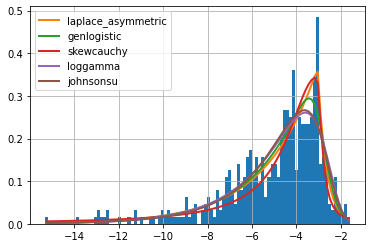

In [129]:
# Fit a distribution
f = Fitter(rt_df["log_target"], timeout=180)
f.fit()
f.summary()


# Plot the room temperature conductivities

In [4]:
fig, ax1 = plt.subplots(figsize=(15.8, 10.91), dpi=600) 

mean = np.mean(rt_df["log_target"])
med = np.median(rt_df["log_target"])

# Fit histogram to data
n,bins,patches = ax1.hist(rt_df["log_target"], bins=50, color='#000000', density=False, zorder=4, rwidth=1.01)
ax1.set_ylabel("Count", fontsize=20)
ax1.set_xlabel("Log$_{10}$($\sigma$)", fontsize=20)

# Add the interquartile range
n_comps = len(rt_df)
conds = sorted(rt_df["log_target"])

# Get distribution parameters, in this case (a, loc, scale), from the distribution found with Fitter
params = st.laplace_asymmetric.fit(rt_df["log_target"])

# evaluate PDF
x = np.linspace(-15, -1, 1000)
pdf = st.laplace_asymmetric.pdf(x, *params)
stds = st.laplace_asymmetric.std(params)
ax1.tick_params(axis='y', labelsize= 18)

# Plot the PDF
ax2 = ax1.twinx() 
fig.set_zorder(ax2.get_zorder()+1)
fig.patch.set_visible(False)

mod = params[1]
cmap = cm.get_cmap("tab20")

# Add the fitted distribution
ax2.plot(x, pdf, 'r', color=cmap(4), zorder=0.5 ,linewidth=4)

# Styling
ax2.set_xlim(-15, -1)
ax1.set_xticks(range(-15, -1))
ax2.set_yticks([])

ax1.tick_params(axis='x', labelsize= 18, width=3)
print(f"Mean: {mean}")
print(f"Median: {med}")
print(f"Mode: {mod}") 

plt.tight_layout()

fig.savefig("img/Figure1.eps", dpi=600, bbox_inches='tight')

Mean: -5.016229647801776
Median: -4.417936637
Mode: -3.0476936863061193


In [10]:
print(f"Room Temperature 10th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) - int(len(rt_df) * 0.05)]}")
print(f"Room Temperature 10th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) + int(len(rt_df) * 0.05)]}")
print()
print(f"Room Temperature 25th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) - int(len(rt_df) * 0.125)]}")
print(f"Room Temperature 25th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) + int(len(rt_df) * 0.125)]}")
print()
print(f"Room Temperature 75th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) - int(len(rt_df) * 0.375)]}")
print(f"Room Temperature 75th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) + int(len(rt_df) * 0.375)]}")
print()
print(f"Room Temperature 90th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) - int(len(rt_df) * 0.45)]}")
print(f"Room Temperature 90th quartile range: {np.sort(rt_df['log_target'])[int(len(rt_df) / 2 ) + int(len(rt_df) * 0.45)]}")
print()


Room Temperature 10th quartile range: -4.610833916
Room Temperature 10th quartile range: -4.211124884

Room Temperature 25th quartile range: -5.092588639
Room Temperature 25th quartile range: -3.920818754

Room Temperature 75th quartile range: -7.301029996
Room Temperature 75th quartile range: -3.036212173

Room Temperature 90th quartile range: -9.447331784
Room Temperature 90th quartile range: -2.665546249



# Plot the room temperature distributions of conductivity based on Structural Family

In [14]:
np.random.seed(1)
struc_lab = rt_df["structure"]

data = (np.linspace(1, 2, 12)[:, np.newaxis] * np.random.randn(12, 200) +
            (np.arange(12) + 2 * np.random.random(12))[:, np.newaxis])

fig = go.Figure() 

# Add each of the violins by structure type
for i, l in enumerate(list(set(struc_lab))):
    dist=rt_df[rt_df["structure"] == l]["log_target"]
    
    fig.add_trace(go.Violin(x=dist,
                        y=[10-50*i for _ in range(len(rt_df[rt_df["structure"] == l]["log_target"]))],
                        name=f'{le.inverse_transform(np.array(l).ravel())[0]} ({len(rt_df[rt_df["structure"] == l])})',
                        scalemode="count",
                        spanmode="hard",
                        scalegroup="this",
                        alignmentgroup=0,
                        width=np.sqrt(len(rt_df[rt_df["structure"] == l])) * (max(dist)-min(dist))))

# Add a violin for the complete distribution
fig.add_trace(go.Violin(x=rt_df["log_target"],
                        y=[50 for _ in range(len(df["log_target"]))],
                        name=f'Complete Distribution ({len(rt_df)})',
                        scalemode="count",
                        spanmode="hard", 
                        scalegroup="all",
                        alignmentgroup=1,
                        width=np.sqrt(510 * 15)))

# Change Styling
fig.update_traces(orientation='h', side='positive',points=False)
fig.update_layout(xaxis_showgrid=False, 
                  xaxis_zeroline=False, 
                  paper_bgcolor='rgba(0,0,0,0)', 
                  plot_bgcolor='rgba(0,0,0,0)', 
                  width=1080, 
                  height=1080)

fig.update_xaxes(categoryorder='category descending')
fig.update_layout(
    xaxis_title="Log Conductivity",
)

write_html(fig, "img/Figure2.html")

fig.show()


# Construct ElM2D Plots of entire Dataset with ICSD (on HPC) and plot with structure types

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


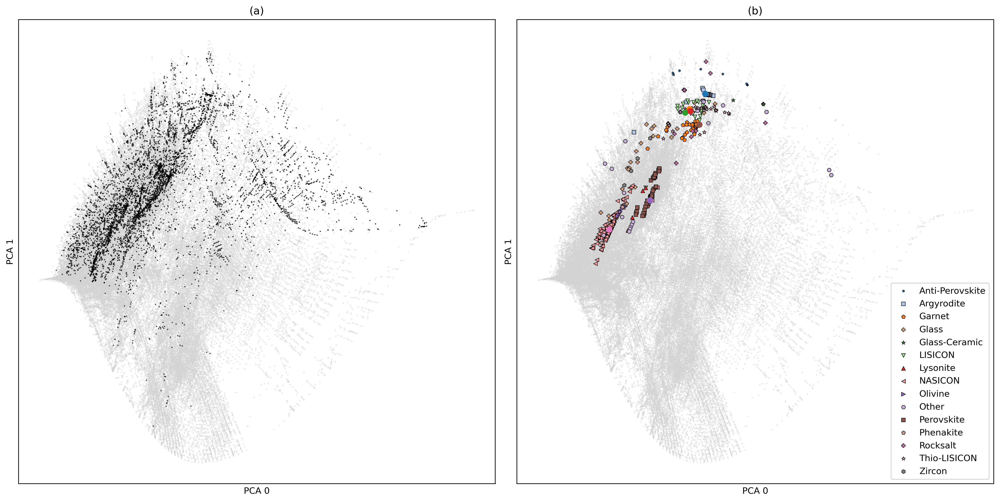

In [15]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15.8,8), dpi=300)

# Take preprocessed coordinates from HPC which have these materials at the end of the list
X = pk.load(open("data/X_PCA_Emb.pk", "rb"))
all_comps  = pk.load(open("data/all_comps.pk", "rb"))
li_inds = [i if "Li" in comp else 0 for i, comp in enumerate(all_comps [:-850])]
embedded_fs = [ElMD(f).pretty_formula for f in all_comps[-850:]]

# Scatter the non electrolyte materials in grey
axs[0].scatter(X[:-850, 0], X[:-850, 1], s=0.051, c='lightgrey', edgecolors=None)

# Overlay the Li electrolytes in black
axs[0].scatter(X[li_inds, 0], X[li_inds, 1], s=0.51, c='black', marker='.', edgecolors=None)

# Styling
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel("PCA 0")
axs[0].set_ylabel("PCA 1")
axs[0].set_title("(a)")
cm2 = cm.get_cmap('Paired')
cm1 = cm.get_cmap('tab10')

# Add our Li in grey to the second plot
axs[1].scatter(X[:-850, 0], X[:-850, 1], s=0.051, c='lightgrey')

struc_lab = df["structure"]
markers = ['.', 's', 'p', 'P', '*', 'v', '^', '<', '>', '8', 's', 'p', 'P', '*', 'h', 'X', 'D', 'o']
cmap = cm.get_cmap('tab20')

for i, l in enumerate(sorted(list(set(struc_lab)))):
    # Select the associated structure indices
    df_inds = np.where(struc_lab == l)[0] 

    # we must stitch these together with the comps with ICSD as different orderings
    x_inds = []
    emb_comps = []
    emb_targ = []
    
    for j, comp in enumerate(df.iloc[df_inds]["pretty_formula"]):
        # Stitch together the structural labels with the embedded compositions and skip otherwise
        index = [i for i, f in enumerate(embedded_fs) if f == comp]
        
        if len(index) > 0:
            index = index[0]
        else:
            continue

        # for index in inds:
        if index not in x_inds:
            x_inds.append(index)
            emb_comps.append(df.iloc[df_inds].iloc[j]["composition"])
            emb_targ.append(df.iloc[df_inds].iloc[j]["log_target"])
    
    inds = np.array(x_inds) + len(X) - 850
    
    c = cmap(i)

    # Add the structures to the plot with the associated marker
    axs[1].scatter(X[inds, 0], X[inds, 1], 
                    s=20, 
                    label=le.inverse_transform([l])[0], 
                    marker=markers[i],
                    edgecolors="k", 
                    linewidth=0.5,
                    color=c)

# Styling
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("PCA 0")
axs[1].set_ylabel("PCA 1")
axs[1].set_title("(b)")
fig.tight_layout()
plt.legend(loc="lower right", fontsize="medium")

# Add specific points for the final publication figure
loc = X[-850 + embedded_fs.index(ElMD("Li6PS5Cl").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("Li10GeP2S12").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("Li9.54Si1.74P1.44S11.7Cl0.3").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("Li3.2PO3.1N0.7").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("La0.57Li0.29TiO3").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("Li7La3Zr2O12").pretty_formula)]
plt.scatter(loc[0], loc[1])
loc = X[-850 + embedded_fs.index(ElMD("Li1.3Al0.3Ti1.7(PO4)3").pretty_formula)]
plt.scatter(loc[0], loc[1])

fig.savefig("img/Figure3.eps")

# Construct ElM2D Plots of the Unique Room Temperature Conductors and Generate LOCO Cluster labels

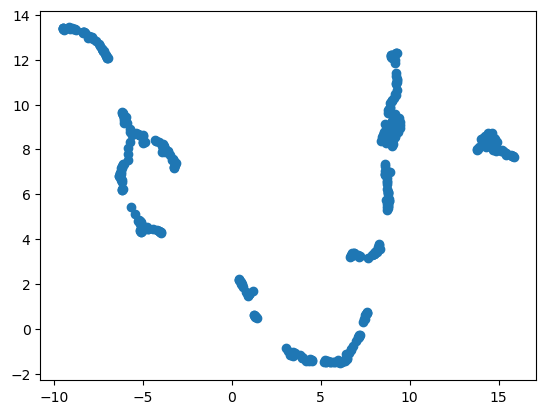

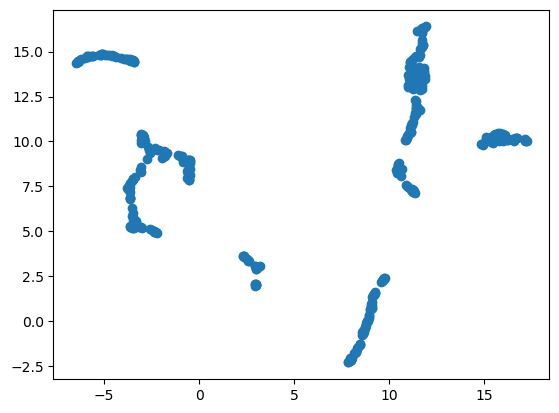

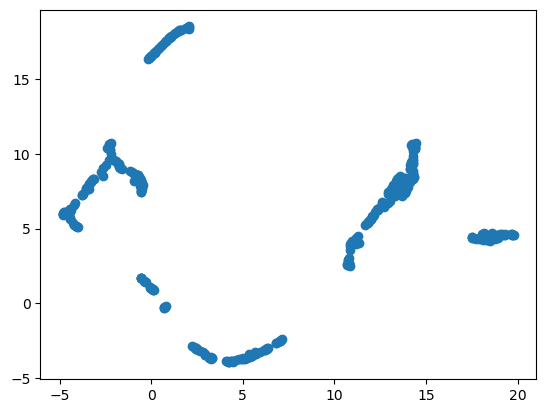

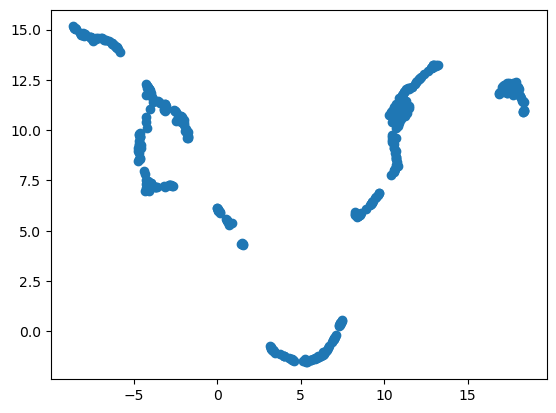

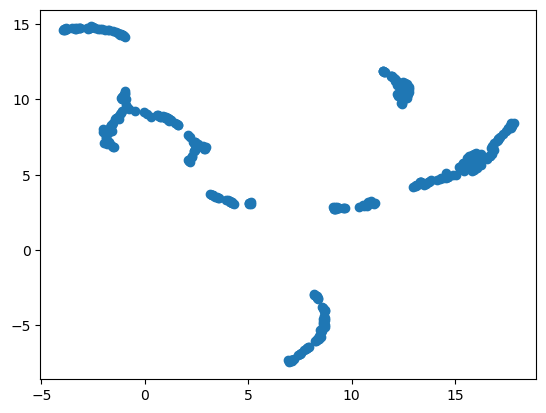

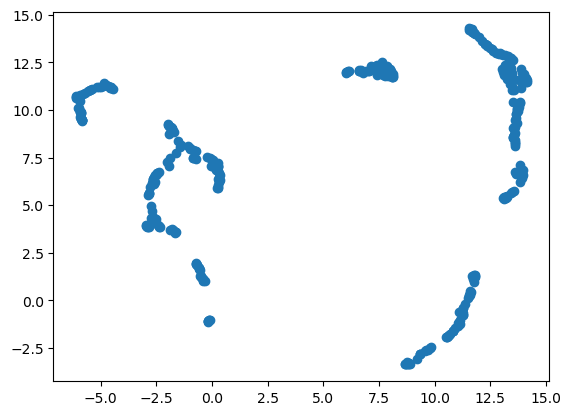

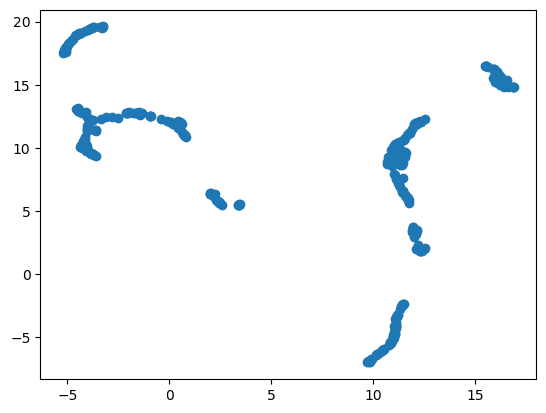

In [18]:
unq_rt_c = sorted(set(rt_df["pretty_formula"]))

# # Use 6 seeds to create the UMAP embedding and choose the one with nicest spread
mapper = ElM2D()

X_ump = mapper.fit_transform(unq_rt_c)
plt.scatter(X_ump[:, 0], X_ump[:, 1])
plt.show()

for rs in range(6):
    mapper.umap_kwargs = {"random_state": rs, "n_components": 2, "spread":5}

    X_ump = mapper.transform()

    plt.scatter(X_ump[:, 0], X_ump[:, 1])
    plt.show()

In [3]:
# 5 comes out looking good, lets use this seed
# umap_kwargs = {"random_state": 5}
# mapper = ElM2D(umap_kwargs = umap_kwargs)

# X_ump = mapper.fit_transform(unq_rt_c)
# X_pca = mapper.PCA(n_components=2)

# pk.dump(X_ump, open(f"data/unq_rt_expt_umap_embedding.pk", "wb"))
# pk.dump(X_pca, open(f"data/unq_rt_expt_pca_embedding.pk", "wb"))

X_ump = pk.load(open(f"data/unq_rt_expt_umap_embedding.pk", "rb"))
X_pca = pk.load(open(f"data/unq_rt_expt_pca_embedding.pk", "rb"))

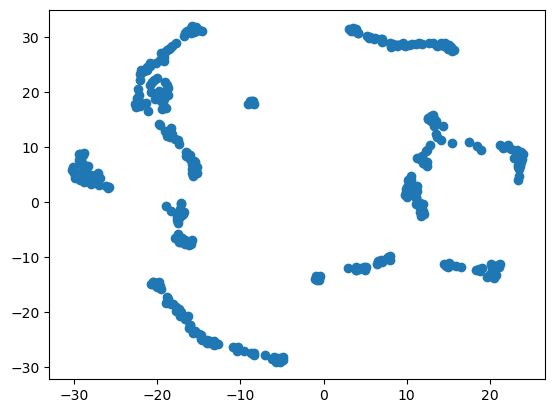

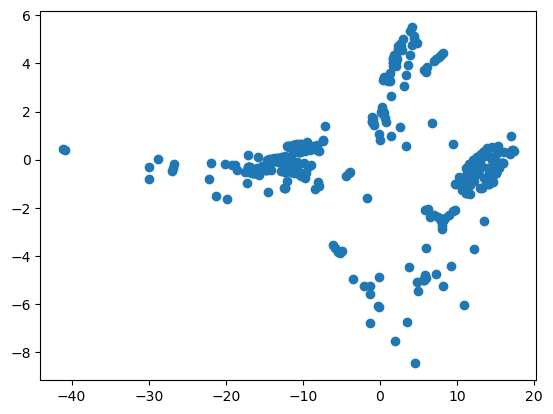

In [8]:
plt.scatter(-X_ump[:, 0], X_ump[:, 1])
plt.show()

plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.show()

9


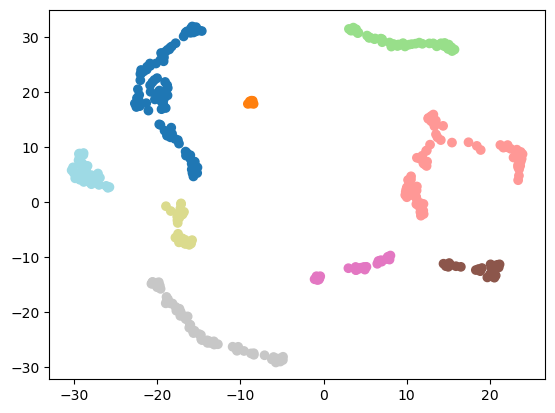

In [5]:
# clf = DBSCAN(eps=4)
# lab = clf.fit_predict(X_ump)

# pk.dump(lab, open(f"data/loco_cluster_labels.pk", "wb"))
lab = pk.load(open(f"data/loco_cluster_labels.pk", "rb"))
print(len(set(lab)))


plt.scatter(-X_ump[:, 0], X_ump[:, 1], c=lab, cmap="tab20")

In [19]:
unq_rt_c = sorted(set(rt_df["pretty_formula"]))
comps = [rt_df.iloc[rt_df["pretty_formula"].to_list().index(f)]["composition"] for f in unq_rt_c]
strucs = [rt_df.iloc[rt_df["pretty_formula"].to_list().index(f)]["family"] for f in unq_rt_c]
target = [rt_df.iloc[rt_df["pretty_formula"].to_list().index(f)]["target"] for f in unq_rt_c]

# Manually assigned colour labels for publication clockwise from top left (should be commented out after single run)
# mapping_d = {0: "4", 
#              1: "1", 
#              2: "6", 
#              3: "8", 
#              4: "0",
#              5: "7", 
#              6: "5",
#              7: "3",
#              8: "2"} 

# pk.dump([int(mapping_d[x]) for x in lab], open(f"data/loco_cluster_labels.pk", "wb"))

# Do not map values if already reassigned for clockwise lanelling
lab = pk.load(open(f"data/loco_cluster_labels.pk", "rb"))


plotly_df = pd.DataFrame({"x": -X_ump[:, 0], 
                          "y": X_ump[:, 1], 
                          "comps": comps, 
                          "family": strucs, 
                          "target": target, 
                          "pretty_formula": unq_rt_c, 
                          "c": [str(x) for x in lab] }) 

px.scatter(plotly_df, 
           x="x", 
           y="y", 
           hover_data=["comps", "family", "target"], 
           color="c")

# Add these labels to the dataframe

In [20]:
unq_rt_c = sorted(set(rt_df["pretty_formula"]))
lab = pk.load(open(f"data/loco_cluster_labels.pk", "rb"))
comp_map = {v: lab[i] for i, v in enumerate(unq_rt_c)}
rt_df["loco"] = rt_df["pretty_formula"].map(comp_map)

# Plot these together for the figure in the paper

In [6]:
f = plt.figure(figsize=(15.8, 15.8), dpi=600)

ax1 = f.add_subplot(221)
ax2 = f.add_subplot(222)
ax3 = f.add_subplot(223)
ax4 = f.add_subplot(224)

cmap = cm.get_cmap('tab20')
plt.style.use('default')

unq_rt_c = sorted(set(rt_df["pretty_formula"]))
struc_lab = [rt_df.iloc[rt_df["pretty_formula"].to_list().index(f)]["structure"] for f in unq_rt_c]
lab = np.array(pk.load(open(f"data/loco_cluster_labels.pk", "rb")))


# Match the colours between the loco and the structural labels manually for publication
colours = [7, 0, 1, 5, 2, 8, 10, 8, 3]

# Iterate over each LOCO cluster label and plot
for i, l in enumerate(list(set(rt_df["loco"]))):
    inds = np.where(lab == l)[0]

    c = cmap(colours[i])
    
    ax1.scatter(-X_ump[inds, 0], X_ump[inds, 1], color=c, s=15, label=l)
    ax3.scatter(X_pca[inds, 0], -X_pca[inds, 1], color=c, s=15, label=f"Cluster {str(l)} ({len(inds)})")

# Iterate over each structural label and plot
for i, l in enumerate(set(struc_lab)):
    inds = np.where(struc_lab == l)[0]
    
    if len(inds) == 0:
        continue
    
    c = cmap(i)
    
    ax2.scatter(-X_ump[inds, 0], X_ump[inds, 1], color=c, s=15, label=l)
    ax4.scatter(X_pca[inds, 0], -X_pca[inds, 1], color=c, s=15, label=f"{le.inverse_transform([l])[0]}", cmap="tab")

# Styling
for i, a in enumerate([ax1, ax2, ax3, ax4]):
    a.set_xticks([])
    a.set_yticks([])
    a.set_title(["(a)", "(b)", "(c)", "(d)"][i], fontdict={'fontsize': 20})
    a.set_xlabel(f"{['UMAP ', 'PCA '][i // 2]} 0", fontsize=18)
    a.set_ylabel(f"{['UMAP ', 'PCA '][i // 2]} 1", fontsize=18)

ax3.legend(loc="upper left", fontsize="xx-large")
ax4.legend(loc="upper left", fontsize="large")

f.tight_layout()
f.savefig("img/Figure4.svg")

# Calculate the median values of the filtered dataframe for ML Investigation

In [25]:
comp_medians = {}

# For each of the reported materials take the median report 
for comp in set(rt_df["pretty_formula"]):
    recordings = np.sort(rt_df[rt_df["pretty_formula"] == comp]["log_target"])
    if len(recordings) == 1:
        comp_medians[comp] = recordings[0]
    else:
        comp_medians[comp] = recordings[int(np.ceil(len(recordings) / 2))]

# Put the median conductivity for each composition back into the dataframe
rt_df["target"] = rt_df["pretty_formula"].map(comp_medians)

# Remove all duplicates from the dataset and write to file for further use
ml_df = rt_df.drop_duplicates(subset="pretty_formula")
ml_df["formula"] = ml_df["pretty_formula"]
ml_df.to_csv("data/ml_dataset.csv", index=False)
ml_df

/tmp/ipykernel_18376/3151325378.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ID,composition,source,temperature,target,log_target,family,ChemicalFamily,structure,pretty_formula,classification_target,loco,formula
1,2,Li2OHBr,10.1002/aenm.201700971,22.06,-6.267606,-6.267606,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Br0.2 H0.2,0,3,Li0.4 O0.2 Br0.2 H0.2
2,3,Li2.4OH0.6Cl,10.1002/aenm.201700971,26.00,-7.050610,-7.050610,Anti-Perovskite,Oxides and Other Anions,0,Li0.48 O0.2 Cl0.2 H0.12,0,2,Li0.48 O0.2 Cl0.2 H0.12
3,4,Li2.1OH0.9Cl,10.1002/aenm.201700971,26.00,-7.094204,-7.094204,Anti-Perovskite,Oxides and Other Anions,0,Li0.42 O0.2 Cl0.2 H0.18,0,3,Li0.42 O0.2 Cl0.2 H0.18
4,5,Li2OHCl,10.1002/aenm.201700971,26.00,-7.148130,-7.148130,Anti-Perovskite,Oxides and Other Anions,0,Li0.4 O0.2 Cl0.2 H0.2,0,3,Li0.4 O0.2 Cl0.2 H0.2
5,6,Li2.7OH0.3Cl,10.1002/aenm.201700971,26.00,-8.136677,-8.136677,Anti-Perovskite,Oxides and Other Anions,0,Li0.54 O0.2 Cl0.2 H0.06,0,2,Li0.54 O0.2 Cl0.2 H0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...
732,2026,Li3.6Ge0.4P0.6S4,10.1149/1.1379028,25.00,-3.654909,-3.654909,Thio-LISICON,NaN,13,Li0.419 Ge0.047 P0.07 S0.465,1,3,Li0.419 Ge0.047 P0.07 S0.465
736,2027,Li3.35Ge0.35P0.65S4,10.1149/1.1379028,25.00,-2.737394,-2.737394,Thio-LISICON,NaN,13,Li0.401 Ge0.042 P0.078 S0.479,1,3,Li0.401 Ge0.042 P0.078 S0.479
743,2028,Li6NiCl8,10.1002/zaac.19875531020,25.00,-9.569675,-9.569675,Rocksalt,NaN,12,Li0.4 Ni0.067 Cl0.533,1,3,Li0.4 Ni0.067 Cl0.533
742,2029,Li6CoCl8,10.1002/zaac.19875531020,25.00,-5.821821,-5.821821,Rocksalt,NaN,12,Li0.4 Co0.067 Cl0.533,0,3,Li0.4 Co0.067 Cl0.533


# Data for supplementary table 1, structural cluster conductivity distribution

In [26]:
ml_df = pd.read_csv("data/ml_dataset.csv")

# Manually assigned labels to make plots easier to read

struc_df = pd.pivot_table(ml_df, values="log_target", index="family", aggfunc=[len, np.mean, np.std, np.max, np.min]).round(2)
struc_df.to_csv("results/struc_class.csv", index=True)
struc_df

,len,mean,std,amax,amin
,log_target,log_target,log_target,log_target,log_target
family,,,,,
Anti-Perovskite,8,-6.07,1.76,-3.03,-8.14
Argyrodite,21,-3.60,2.03,-1.85,-10.00
Garnet,50,-4.24,1.21,-2.69,-8.06
Glass,31,-6.16,1.98,-2.23,-8.89
Glass-Ceramic,5,-5.72,1.27,-4.90,-7.95
...,...,...,...,...,...
Perovskite,58,-4.29,1.25,-2.80,-8.00
Phenakite,3,-10.70,0.24,-10.50,-10.97


# Data for supplementary table 2, LOCO cluster conductivity distribution

In [27]:
ml_df = pd.read_csv("data/ml_dataset.csv")

# Manually assigned labels to make plots easier to read
loco_df = pd.pivot_table(ml_df, values="log_target", index="loco", aggfunc=[len, np.mean, np.std, np.max, np.min]).round(2)
loco_df.to_csv("results/loco_class.csv", index=True)
loco_df

,len,mean,std,amax,amin
,log_target,log_target,log_target,log_target,log_target
loco,,,,,
0,93,-4.58,1.38,-2.21,-7.56
1,6,-6.70,1.20,-5.54,-8.70
2,44,-4.91,2.50,-1.85,-13.93
3,81,-5.28,2.98,-1.60,-13.04
4,26,-4.74,1.22,-2.89,-7.16
5,25,-5.28,1.80,-2.10,-10.18
6,64,-4.49,1.61,-2.80,-11.27
7,28,-7.59,2.07,-3.40,-11.20


# Add the violins for the distribution of conductivities for each of the LOCO clusters

In [28]:
np.random.seed(1)

data = (np.linspace(1, 2, 12)[:, np.newaxis] * np.random.randn(12, 200) +
            (np.arange(12) + 2 * np.random.random(12))[:, np.newaxis])

fig = go.Figure() 

for i, l in enumerate(list(set(ml_df["loco"]))):
    dist=ml_df[ml_df["loco"] == l]["log_target"]
    
    fig.add_trace(go.Violin(x=dist,
                        y=[10-35*i for _ in range(len(ml_df[ml_df["loco"] == l]["log_target"]))],
                        name=f'LOCO Cluster {l} ({len(ml_df[ml_df["loco"] == l])})',
                        scalemode="count",
                        spanmode="hard",
                        scalegroup="this",
                        alignmentgroup=0,
                        width=np.sqrt(len(ml_df[ml_df["loco"] == l])) * (max(dist)-min(dist))))
                                
fig.update_traces(orientation='h', side='positive',points=False)
fig.update_layout(xaxis_showgrid=False, 
                  xaxis_zeroline=False, 
                  paper_bgcolor='rgba(0,0,0,0)', 
                  plot_bgcolor='rgba(0,0,0,0)', 
                  width=1080, 
                  height=1080)

fig.update_xaxes(categoryorder='category descending')
fig.update_layout(
    xaxis_title="Log Conductivity",
)

write_html(fig, "img/SupplementaryFigure4.html")

fig.show()
